# Scanpy: 空間的トランスクリプトミクスデータの解析と可視化

空間的トランスクリプトーム解析によって組織切片の遺伝子発現を可視化します.

元URL : https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html

作成者 : 服部竜也

作成日 : 2021年1月12日

このチュートリアルでは空間的トランスクリプトミクスデータの扱い方を実演します.

10x Genonmics社の[Visium](https://www.10xgenomics.com/spatial-transcriptomics/)データに焦点を当てます. また, FISHベースの技術によって生成されたデータである[MERFISH](https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html#MERFISH-example)の事例も提供します.

- [MERFISH](https://www.pnas.org/content/116/39/19490)について

In [ ]:
!pip install scanpy

In [ ]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
sc.logging.print_header()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.5 scipy==1.4.1 pandas==1.1.5 scikit-learn==0.22.2.post1 statsmodels==0.10.2


## **データの読み込み**

今回用いるのは, 10x Genonmics社で公開されているヒトのリンパ節のVisium空間的トランスクリプトミクスデータセットです[[link](https://support.10xgenomics.com/spatial-gene-expression/datasets/1.0.0/V1_Human_Lymph_Node)].

[`datasets.visium_sge()`](https://scanpy.readthedocs.io/en/latest/api/scanpy.datasets.visium_sge.html)は10x Genonmics社からデータセットをダウンロードし, カウントデータ, 画像, 空間座標を含んだAnnDataオブジェクトを返す関数です.
基準となるQCの指標と, サンプルごとのミトコンドリアRNAの割合は[`pp.calculate_qc_metrics`](https://scanpy.readthedocs.io/en/latest/api/scanpy.pp.calculate_qc_metrics.html)で計算します.

自分のVisiumデータを用いる際には, [`sc.read_visium()`](https://scanpy.readthedocs.io/en/latest/api/scanpy.read_visium.html)関数を使用して読み込んでください.

In [ ]:
# データのダウンロード
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()

# "MT-"で始まるミトコンドリアRNAを抽出して`adata.vars["mt"]`に格納
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)


reading /content/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


- Visium データの adata 構造はこのようになっています.

In [ ]:
adata

AnnData object with n_obs × n_vars = 4039 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

## **QCと前処理**

総数と発現遺伝子に基づいて, スポットの基本的なフィルタリングを行います.


- カウントデータは, 各遺伝子上のタグ(UMI; Unique Molecular Identifer)を数えたものです.
- 前処理では, 精度の低い細胞のフィルタリングを目的としています. 様々な観点からデータを眺め, フィルタリングを行った後に再度QCを行います. 精度の高い細胞を取るのか, 多くの細胞を取るのかのどっちを重要視するかで決めます. [たとえば, 細胞によって発現している遺伝子数が異なるため, 指定する値によっては一部の種類の細胞が解析対象外となってしまう可能性がある](https://jp.illumina.com/content/dam/illumina-marketing/apac/japan/documents/pdf/webinar/professional-webinar-single-cell-190131.pdf).
1. nUMI数や, 発現遺伝子数が少ない -> 十分な量のRNAを取得できなかった可能性がある
2. nUMI数や, 発現遺伝子数が多い -> doublet(一細胞ではない)である可能性がある
3. ミトコンドリアRNAの割合が高い -> 死細胞である可能性がある

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

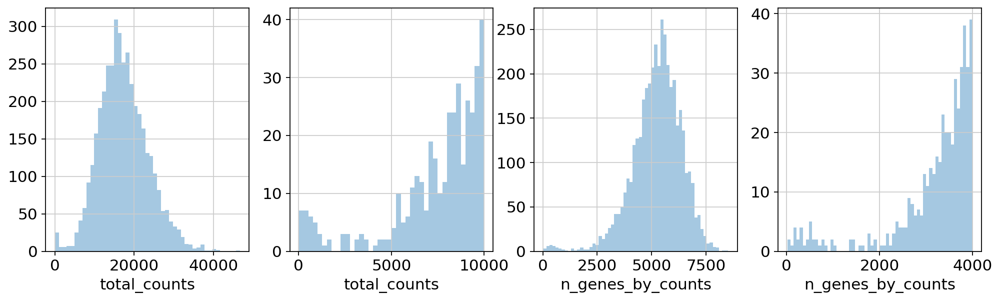

In [ ]:
# フィルタリングの閾値を決定するために密度分布を可視化
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

- 今回のフィルタリングの条件
    - `filter_cells`: 解析対象を最低5000種類, 最大35000種類の遺伝子が検出されている細胞のみに絞る
    - `filter_genes`: 解析対象を最低, 10個以上の細胞で発現が検出されている遺伝子のみに絞る

In [ ]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 51 cells that have less than 5000 counts
filtered out 26 cells that have more than 35000 counts
#cells after MT filter: 3962
filtered out 15071 genes that are detected in less than 10 cells


Trying to set attribute `.var` of view, copying.


Scanpyの組み込み関数である`normalize_total`メソッドを用いてVisiumカウントデータを正規化し, 後ほど必要となる有意に変動している発現遺伝子(highly-variable genes)を検出します. 正規化のための代替手段があることに注意してください([[Luecken19](https://www.embopress.org/doi/full/10.15252/msb.20188746)]の議論や, [SCTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1)や[GLM-PCA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1861-6)のような最近の代替手段を参照してください).

- 有意な発現遺伝子(highly-variable genes)を検出するのは, クラスターの細胞種を同定する際に全ての遺伝子を用いるのではなく, 有意な発現遺伝子(highly-variable genes)を用いてクラスターの発現変動の特徴を検出するためです.

In [ ]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## **トランスクリプトームの類似性に基づいたManifold embeddingとクラスタリング**

トランスクリプトームの類似性によって表現された多様体を埋め込み, クラスタリングするために, 標準的なクラスタリングのチュートリアルとして進めます.


In [ ]:
!pip3 install leidenalg

     |████████████████████████████████| 2.4MB 7.8MB/s 
     |████████████████████████████████| 3.2MB 19.9MB/s 


In [ ]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


UMAPの総カウント数と検出された遺伝子に関連して, UMAPに特定の構造があるかどうかを確かめるために, いくつかの共変量をプロットします.

... storing 'feature_types' as categorical
... storing 'genome' as categorical


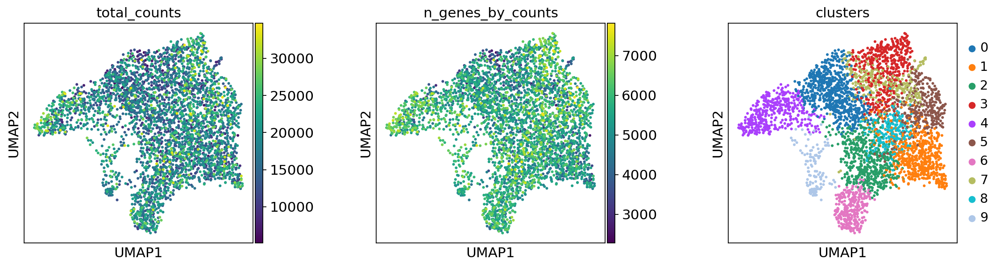

In [ ]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## **空間座標での可視化**

ここで, `total_counts`と`n_gene_by_count`が空間座標でどのように振る舞うかを見てみましょう. [`sc.pl.spatial`](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html)関数を使用して, HE染色画像上に円形のスポットを重ね合わせます.



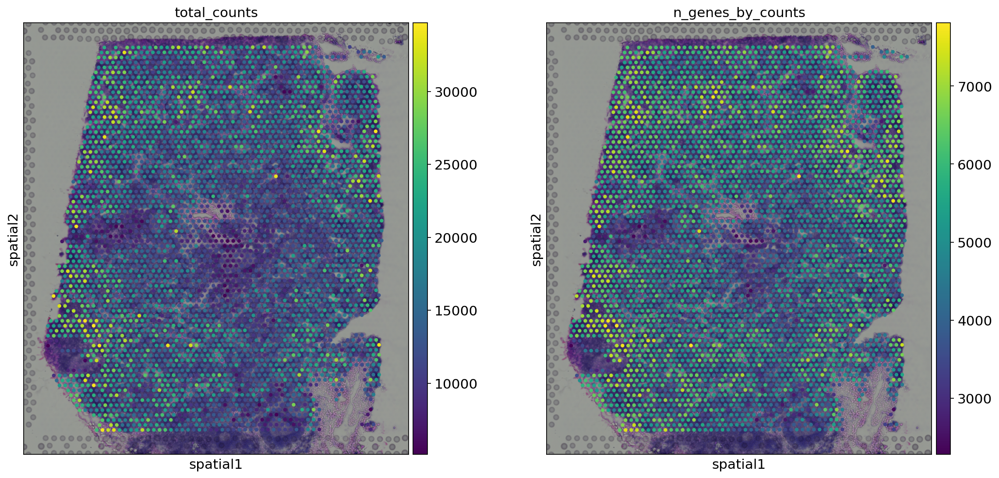

In [ ]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

[`sc.pl.spatial`](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html)関数は追加で4つのパラメータを与えることができます. 

1. `img_key`: `adata.uns`の画像が格納されているキー
2. `crop_coord`: 切り抜きに使用する座標(左, 右, 上, 下)の指定
3. `alpha_img`: HE染色画像の透明度
4. `bw`: `bw=True`でHE染色画像をグレースケールに変換


さらに, [`sc.pl.spatial`](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html)では, `size`パラメータの振る舞いが変化し, スポットサイズのスケーリングファクターとなっています.

前に, 遺伝子発現空間でのクラスタリングを実行し, UMAPを用いて結果を可視化しました. クラスタリングされたサンプルを空間次元で可視化することで, 組織構成や, 細胞間のコミュニケーションについての洞察を得ることができる可能性があります.

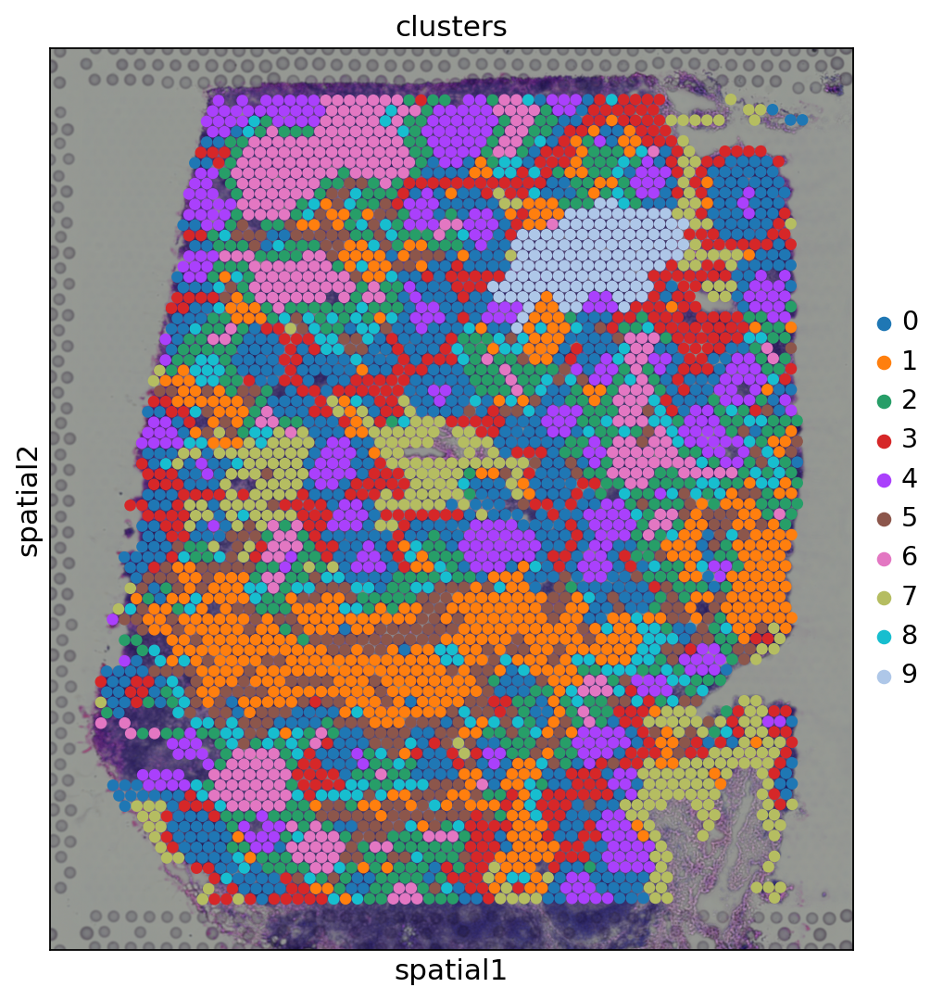

In [ ]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

遺伝子発現空間において, 同じクラスターに属するスポットは空間的に同時に起こる事が多くあります. 例えば, クラスター4(元のtutorialとはクラスターが異なる)に属するスポットは, クラスター0に属するスポットに囲まれていることが多くなっています.

`crop_coord`で関心のある特定の領域をズームインすることにより, 定性的な洞察を得ることができる. さらに, スポットのアルファ値(透明度)を変えることで, H&E画像からその下にある組織の形態をより良く可視化することができます.

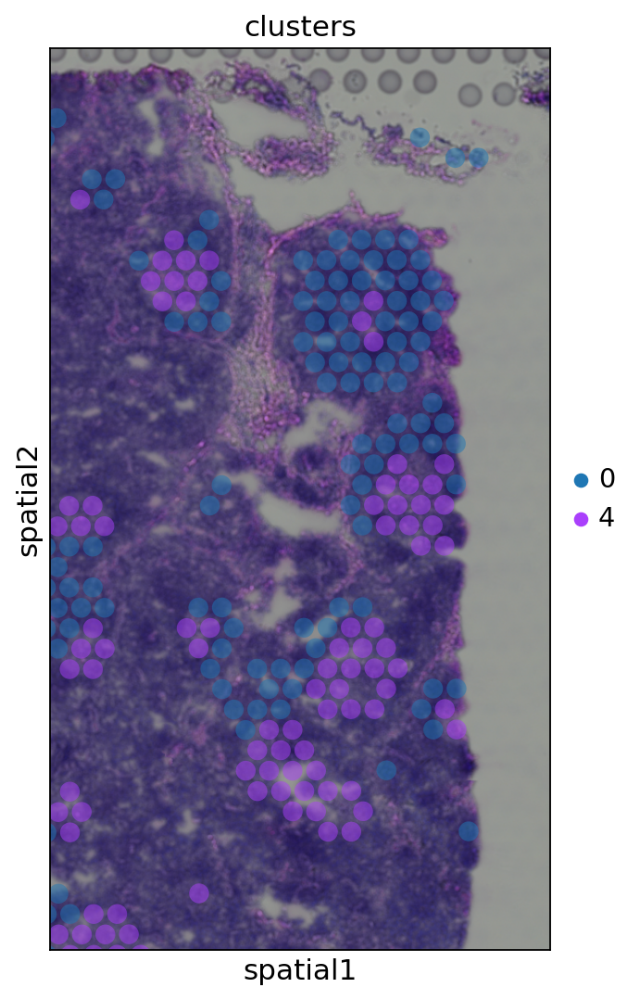

In [ ]:
sc.pl.spatial(adata, img_key="hires", color="clusters", groups=["0", "4"], crop_coord=[1200, 1700, 1900, 1000], alpha=0.5, size=1.3)

## **Cluster marker genes**

さらに, 画像上の小さなスポットのグループで発生しているクラスター4(元のtutorialとはクラスターが異なる)を調べてみましょう.

マーカー遺伝子を計算し, その上位10個のマーカー遺伝子の発現レベルをクラスタ間で比較したヒートマップをプロットします.

ranking genes


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 4


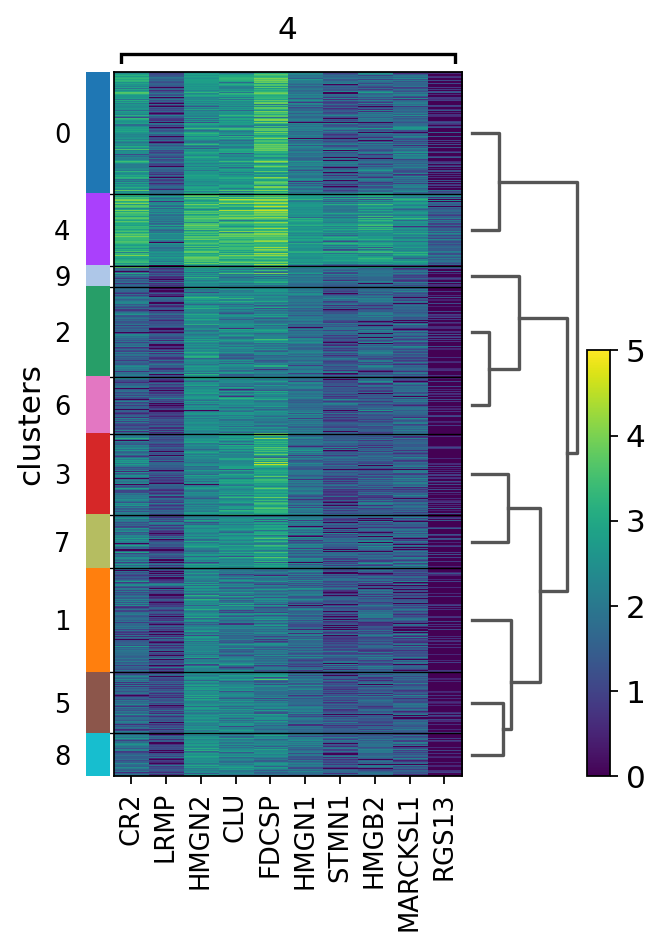

In [ ]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="4", n_genes=10, groupby="clusters")

*CR2*が空間構造を再現していることがわかります.

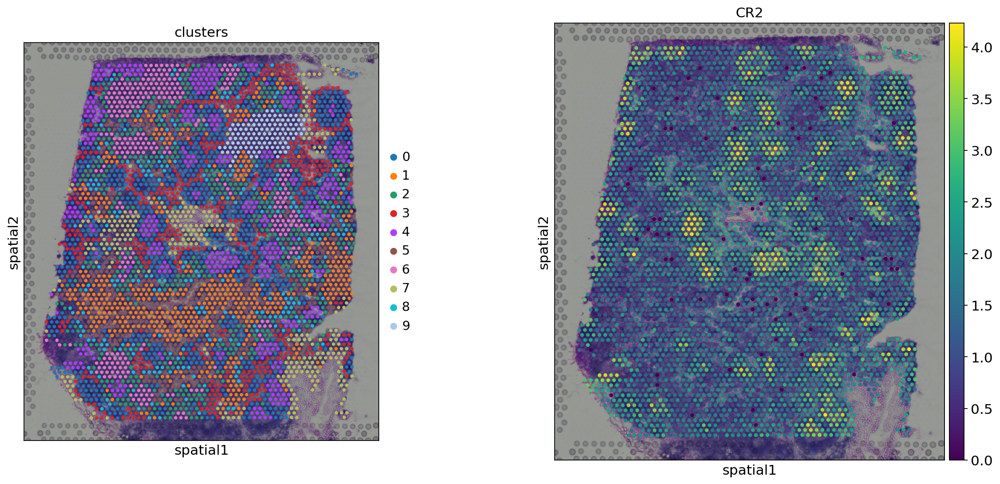

In [ ]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])

## **空間的に変化する遺伝子(Spatially variable genes)**

空間的トランスクリプトミクスは, 研究者が遺伝子発現の傾向が空間的にどのように変化するかを調査し, その結果, 遺伝子発現の空間的パターンを特定することを可能にします. この目的のために, 空間的に変化する遺伝子を同定することを目的としたガウス過程ベースの統計分析フレームワークであるSpatialDE [Svensson18](https://www.nature.com/articles/nmeth.4636)([code](https://github.com/Teichlab/SpatialDE))を使用しています.

In [ ]:
!pip install spatialde

  Created wheel for NaiveDE: filename=NaiveDE-1.2.0-cp36-none-any.whl size=5714 sha256=d87dbbefad70d8e053c2f5d18429824302a4239c64bf4b446e36d56915bb4b7e
  Stored in directory: /root/.cache/pip/wheels/b3/04/e0/8b3b44e9c5a797847d1c47850867ebe8feb603cf1e052c5d11
Successfully built NaiveDE


最近では, 空間的に変化する遺伝子の同定のために, 以下のような他のツールが提案されています.

- SPARK : [論文](https://www.nature.com/articles/s41592-019-0701-7#Abs1) - [code](https://github.com/xzhoulab/SPARK)
- trendsceek : [論文](https://www.nature.com/articles/nmeth.4634) - [code](https://github.com/edsgard/trendsceek)
- HMRF : [論文](https://www.nature.com/articles/nbt.4260) - [code](https://bitbucket.org/qzhudfci/smfishhmrf-py/src/default/)

まず, 正規化されたカウントと座標をspatialDEのinputに必要なpandasのデータフレームに変換します.

SpatialDEの実行には時間がかかります(1時間程度).

In [ ]:
import SpatialDE

In [ ]:
%%time
counts = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['spatial'], columns=['x_coord', 'y_coord'], index=adata.obs_names)
results = SpatialDE.run(coord, counts)

/usr/local/lib/python3.6/dist-packages/SpatialDE/base.py:26: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])
/usr/local/lib/python3.6/dist-packages/SpatialDE/base.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])


/usr/local/lib/python3.6/dist-packages/SpatialDE/base.py:178: RuntimeWarning: divide by zero encountered in double_scalars
  s2_logdelta = 1. / (derivative(LL_obj, np.log(max_delta), n=2) ** 2)



CPU times: user 1h 21min 46s, sys: 17min 37s, total: 1h 39min 23s
Wall time: 53min 47s


結果を変数のアノテーションのDataFrameと連結します: `adata.var`

In [ ]:
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)

そして, 空間的に変化する重要な遺伝子を調べ, `sc.pl.spatial`関数で可視化することができます。

In [ ]:
results.sort_values("qval").head(10)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
LIMD2,0.108978,4,LIMD2,474.169746,8.020752,-1653.385922,2.278765,0.081972,SE,3962,0.000014,0.001357,0.005342,3339.909862,-1756.359378,102.973456,0.0,0.0
GNLY,0.080820,4,GNLY,474.169746,11.157036,-2417.959601,0.312839,0.018210,SE,3962,0.000009,0.001362,0.007894,4869.057219,-2503.828588,85.868987,0.0,0.0
CD8A,0.117029,4,CD8A,474.169746,7.401517,-2904.126495,0.521821,0.035900,SE,3962,0.000014,0.001150,0.004851,5841.391007,-3018.082777,113.956282,0.0,0.0
MAL,0.118639,4,MAL,474.169746,7.287731,-2237.639883,0.318591,0.024802,SE,3962,0.000013,0.001094,0.004633,4508.417784,-2358.595922,120.956038,0.0,0.0
ARID5A,0.075936,4,ARID5A,474.169746,11.937692,-3206.528726,1.107541,0.038445,SE,3962,0.000010,0.001774,0.016042,6446.195468,-3277.022879,70.494153,0.0,0.0
ZAP70,0.170919,4,ZAP70,474.169746,4.758532,-3262.020920,1.134856,0.076788,SE,3962,0.000012,0.000588,0.005286,6557.179857,-3490.231207,228.210287,0.0,0.0
HSP90AA1,0.091503,4,HSP90AA1,903.680539,9.292787,-2081.546825,2.111866,0.037317,SE,3962,0.000053,0.006654,0.004660,4196.231668,-2188.419545,106.872719,0.0,0.0
NT5DC4,0.081217,4,NT5DC4,474.169746,11.097710,-1241.957225,0.164830,0.009781,SE,3962,0.000010,0.001590,0.011165,2517.052467,-1316.832779,74.875554,0.0,0.0
ACTR3,0.101068,4,ACTR3,474.169746,8.725309,-2939.667903,1.601502,0.060381,SE,3962,0.000012,0.001311,0.004654,5912.473824,-3039.229126,99.561223,0.0,0.0


... storing 'model' as categorical


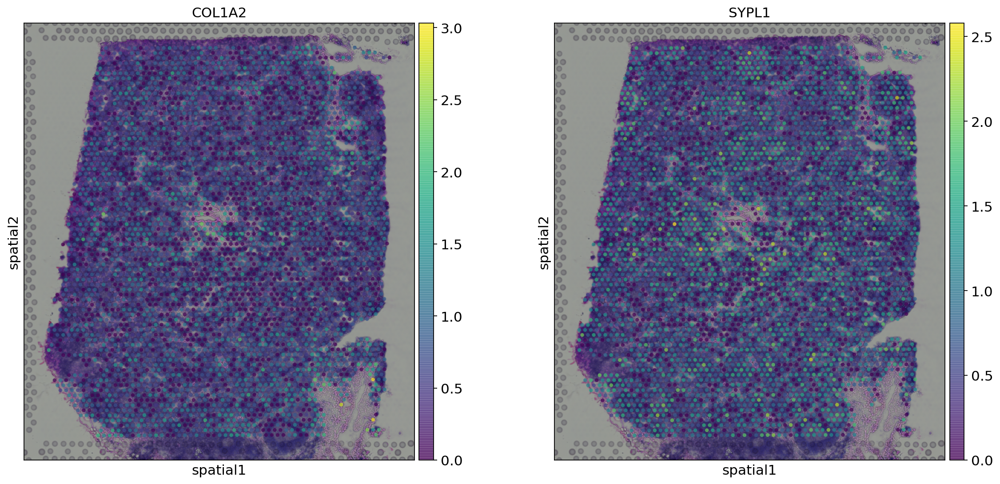

In [ ]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)

## **MERFISHの例**

FISHベースの手法で生成した空間データがある場合は, 座標表を読み込んで`adata.obsm`に代入するだけです.

[Xia et al. 2019](https://www.pnas.org/content/116/39/19490.abstract)の例を見てみましょう。

まず, [元の論文](https://www.pnas.org/content/116/39/19490/tab-figures-data)から座標とカウントデータをダウンロードします.



In [ ]:
import urllib.request

In [ ]:
url_coord = "https://www.pnas.org/highwire/filestream/887973/field_highwire_adjunct_files/15/pnas.1912459116.sd15.xlsx"
filename_coord = "pnas.1912459116.sd15.xlsx"
urllib.request.urlretrieve(url_coord, filename_coord)

('pnas.1912459116.sd15.xlsx', <http.client.HTTPMessage at 0x7f7becc177b8>)

In [ ]:
url_counts = "https://www.pnas.org/highwire/filestream/887973/field_highwire_adjunct_files/12/pnas.1912459116.sd12.csv"
filename_counts = "pnas.1912459116.sd12.csv"
urllib.request.urlretrieve(url_counts, filename_counts)

('pnas.1912459116.sd12.csv', <http.client.HTTPMessage at 0x7f7bdfde7b38>)

そして, AnnDataオブジェクトにデータを読み込みます.

In [ ]:
coordinates = pd.read_excel("./pnas.1912459116.sd15.xlsx", index_col=0)
counts = sc.read_csv("./pnas.1912459116.sd12.csv").transpose()

In [ ]:
adata_merfish = counts[coordinates.index, :]
adata_merfish.obsm["spatial"] = coordinates.to_numpy()

標準的な前処理と次元削減を行います.

In [ ]:
sc.pp.normalize_per_cell(adata_merfish, counts_per_cell_after=1e6)
sc.pp.log1p(adata_merfish)
sc.pp.pca(adata_merfish, n_comps=15)
sc.pp.neighbors(adata_merfish)
sc.tl.umap(adata_merfish)
sc.tl.leiden(adata_merfish, key_added="clusters", resolution=0.5)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA
    with n_comps=15
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 6 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


実験は, 単一の細胞種（培養U2-OS細胞）から遺伝子発現数を測定することからなっています. クラスターは, 細胞周期の異なる段階にある細胞の状態で構成されています. 実験のセットアップから, 空間次元での特定の構造は期待していません. 

Leidenを実行して得られたクラスターをUMAP空間と空間座標で可視化するとこのような感じになります. 

In [ ]:
adata_merfish

AnnData object with n_obs × n_vars = 645 × 12903
    obs: 'n_counts', 'clusters'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

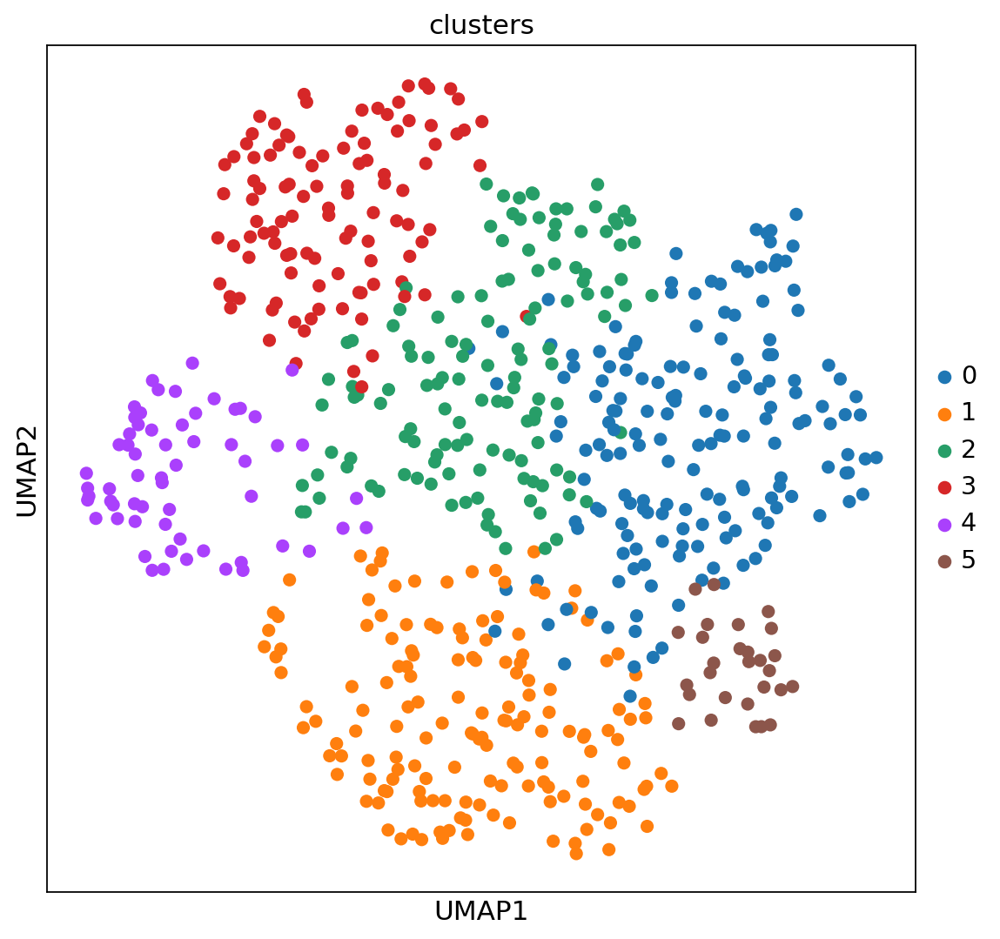

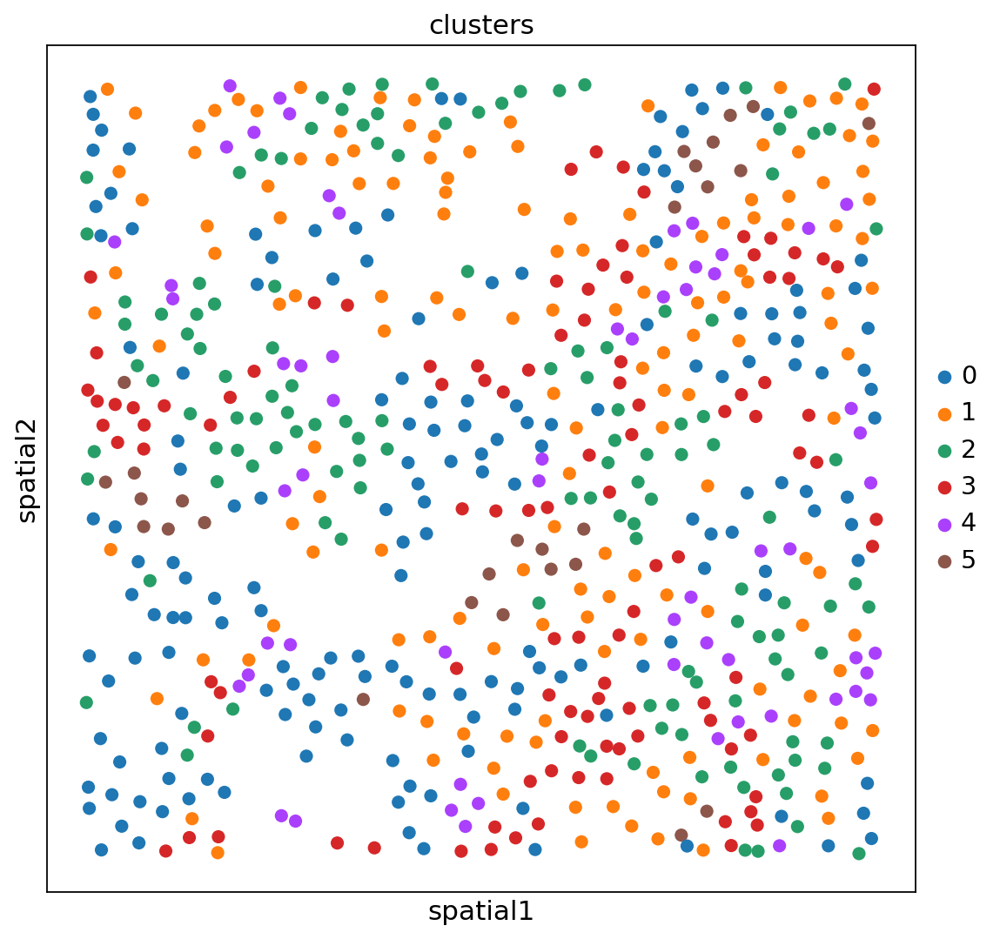

In [ ]:
sc.pl.umap(adata_merfish, color="clusters")
sc.pl.embedding(adata_merfish, basis="spatial", color="clusters")

In [ ]:
from sinfo import sinfo
sinfo()

-----
SpatialDE   NA
anndata     0.7.5
matplotlib  3.2.2
pandas      1.1.5
scanpy      1.6.0
seaborn     0.11.1
sinfo       0.3.1
-----
IPython             5.5.0
jupyter_client      5.3.5
jupyter_core        4.7.0
notebook            5.3.1
-----
Python 3.6.9 (default, Oct  8 2020, 12:12:24) [GCC 8.4.0]
Linux-4.19.112+-x86_64-with-Ubuntu-18.04-bionic
2 logical CPU cores, x86_64
-----
Session information updated at 2021-01-12 02:53


チュートリアルがお役に立てたのであれば幸いです.
Scanpyで見たい機能や外部ツールがありましたら, [こちら](https://github.com/theislab/scanpy/issues/new?labels=enhancement&template=enhancement-request.md)にご報告ください.
我々はScanpyとAnnDataを拡張して, Imaging Mass Cytometryのような他の空間データタイプをサポートし, データ構造を拡張して空間グラフや追加機能をサポートするようにしています. ご期待ください.